# Исследование рынка заведений общественного питания Москвы

## Введение

В данной работе предстоит подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места для открытия заведения общественного питания.

В исследовании представлена работа с датасетом с заведениями общественного питания Москвы, составленным на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Таблица содержит следующие данные:

- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»;
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»;
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- `district` — административный район, в котором находится заведение;
- `seats` — количество посадочных мест.

Для проведения анализа необходимо:

- выполнить предобработку данных: установить корректный тип данных, провести проверку на пропуски и дубликаты;
- добавить новые столбцы в исходный датафрейм (с названием улиц, а также отдельный столбец с обозначением работает ли заведение ежедневно и круглосуточно (24/7));
- выполнить анализ данных;
- детализировать исследования в отношении открытия кофейни;
- подготовить презентацию.

Приступим к анализу:


### Загрузка данных и их подготовка к анализу

In [5]:
# импорт библиотек

import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import numpy as np
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster
import warnings
warnings.simplefilter("ignore")

Запишем данные о заведениях общественного питания Москвы в датафрейм `places` и подготовим их к анализу.

In [7]:
places = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [8]:
# создадим функцию для первичной обработки данных (вывод общей информации)

def research(data):
    display(data.head(10))                                       # вывод первых строк датафрейма
    print('*' * 50)                                              # разделитель
    data.info()                                                  # вывод общей информации о датафрейме
    print('*' * 50, '\n\033[1m Количество полных дублей: \033[0m', 
            data.duplicated().sum())                             # проверка на полные дубликаты
    print('*' * 50)
    display(data.describe())                                     # описание распределения численных значений
    print('*' * 50)
    
    for x in data.columns:
        display(data[x].value_counts().to_frame())               # распределение значений в каждом столбце

Обратимся к функции и изучим общую информацию о датафрейме:

In [10]:
research(places)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


**************************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
**********

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


**************************************************


,count
name,
Кафе,189
Шоколадница,120
Домино'с Пицца,76
Додо Пицца,74
One Price Coffee,71
...,...
Сащя,1
Мой дом,1
Stardogs,1


,count
category,
кафе,2378
ресторан,2043
кофейня,1413
"бар,паб",765
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


,count
address,
"Москва, проспект Вернадского, 86В",28
"Москва, Усачёва улица, 26",26
"Москва, площадь Киевского Вокзала, 2",20
"Москва, Ярцевская улица, 19",20
"Москва, Каширское шоссе, 61Г",16
...,...
"Москва, улица Герасима Курина, 6",1
"Москва, Кутузовский проспект, 36, стр. 5",1
"Москва, улица Мнёвники, 11",1


,count
district,
Центральный административный округ,2242
Северный административный округ,900
Южный административный округ,892
Северо-Восточный административный округ,891
Западный административный округ,851
Восточный административный округ,798
Юго-Восточный административный округ,714
Юго-Западный административный округ,709
Северо-Западный административный округ,409


,count
hours,
"ежедневно, 10:00–22:00",759
"ежедневно, круглосуточно",730
"ежедневно, 11:00–23:00",396
"ежедневно, 10:00–23:00",310
"ежедневно, 12:00–00:00",254
...,...
"пн-пт 17:00–03:00; сб,вс 17:00–05:00",1
"пн,вт 09:00–21:00; ср-пт 09:00–22:00; сб 10:00–22:00; вс 10:00–21:00",1
пн-пт 12:00–01:00,1


,count
lat,
55.805361,3
55.777224,3
55.746918,3
55.762784,3
55.706883,3
...,...
55.810758,1
55.796652,1
55.809204,1


,count
lng,
37.574534,3
37.653027,3
37.513952,3
37.732745,3
37.592096,3
...,...
37.810661,1
37.741055,1
37.870185,1


,count
rating,
4.3,1513
4.4,1351
4.2,1041
4.1,785
4.5,623
4.0,499
4.7,440
4.6,422
3.9,252


,count
price,
средние,2117
выше среднего,564
высокие,478
низкие,156


,count
avg_bill,
Средний счёт:1000–1500 ₽,241
Средний счёт:1500–2000 ₽,120
Средний счёт:300–500 ₽,90
Средний счёт:500–1000 ₽,78
Средний счёт:1500–2500 ₽,68
...,...
Цена бокала пива:180–260 ₽,1
Средний счёт:407 ₽,1
Средний счёт:170–490 ₽,1


,count
middle_avg_bill,
1250.0,247
1000.0,175
300.0,148
1500.0,146
400.0,134
...,...
383.0,1
255.0,1
67.0,1


,count
middle_coffee_cup,
256.0,43
60.0,33
95.0,32
150.0,24
170.0,18
...,...
137.0,1
315.0,1
167.0,1


,count
chain,
0,5201
1,3205


,count
seats,
40.0,253
100.0,213
60.0,175
50.0,168
80.0,160
...,...
161.0,1
430.0,1
131.0,1


**Вывод**

- в данных содержится 8406 строк и 14 столбцов;
- типы данных представлены тремя видами: `float64(6), int64(1), object(7)`;
- некоторые столбцы имеют пропуски: `hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats`;
- полные дубли в данных отсутствуют;
- всего в датафрейме **5614** различных заведений, которые делятся на **8** категорий и располагаются в **9** различных районах Москвы.

## Предобработка данных

### Преобразование типов данных

Столбцы, имеющие небольшое количество уникальных значений, можно привести к категориальному типу данных для сокращения использования памяти. К таким столбцам можно отнести категорию заведения, район и категорию прайса. 

Столбец `chain` может иметь только 2 значения: сетевое заведение или нет, поэтому его тип можно преобразовать в `bool`:

In [16]:
places = places.astype({'category': 'category',
                        'district': 'category',
                        'price': 'category',
                        'chain': 'bool'})

In [17]:
places.info() # проверка

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   name               8406 non-null   object  
 1   category           8406 non-null   category
 2   address            8406 non-null   object  
 3   district           8406 non-null   category
 4   hours              7870 non-null   object  
 5   lat                8406 non-null   float64 
 6   lng                8406 non-null   float64 
 7   rating             8406 non-null   float64 
 8   price              3315 non-null   category
 9   avg_bill           3816 non-null   object  
 10  middle_avg_bill    3149 non-null   float64 
 11  middle_coffee_cup  535 non-null    float64 
 12  chain              8406 non-null   bool    
 13  seats              4795 non-null   float64 
dtypes: bool(1), category(3), float64(6), object(4)
memory usage: 690.6+ KB


### Обработка пропусков

Выведим сумму пропусков в каждом столбце датафрейма:

In [20]:
places.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

В столбцах, содержащих информацию о днях и часах работы (`hours`), категории прайса (`price`), среднем чеке или стоимостии заказа (`avg_bill`, `middle_avg_bill`, `middle_avg_bill`), а также о количестве посадочных мест (`seats`), нельзя заполнить пропуски ни средним, ни медианным значением и вывести какую-либо закономерность по известным данным для заполнения пропусков невозможно.

При этом удаление строк с пропусками приведёт в потере возможно важной информации, поэтому оставим пропуски в текущих данных без обработки.

### Обработка неявных дубликатов

Так как явных дубликатов нет, можно проверить строки с неявными дубликатами, например, по двум столбцам - с названием и адресом заведений. При этом приведём данные в этих столбцах к нижнему регистру. Чтобы не менять регистр в основном датафрейме создадим новый `buffer`:

In [24]:
buffer = places[['name', 'address']]

In [25]:
for x in buffer.columns:
        buffer[x] = buffer[x].str.lower()

In [26]:
buffer[buffer[['name', 'address']].duplicated()] # поиск дубликатов по названию и адресу заведений

,name,address
215,кафе,"москва, парк ангарские пруды"
1511,more poke,"москва, волоколамское шоссе, 11, стр. 2"
2420,раковарня клешни и хвосты,"москва, проспект мира, 118"
3109,хлеб да выпечка,"москва, ярцевская улица, 19"


In [27]:
# удаляем дубликаты в исходном датафрейме по индексам строк

places = (places.drop(index = buffer[buffer[['name', 'address']].duplicated()].index)).reset_index()

In [28]:
places.info() # проверка сократилось ли кол-во строк

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8402 entries, 0 to 8401
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   index              8402 non-null   int64   
 1   name               8402 non-null   object  
 2   category           8402 non-null   category
 3   address            8402 non-null   object  
 4   district           8402 non-null   category
 5   hours              7867 non-null   object  
 6   lat                8402 non-null   float64 
 7   lng                8402 non-null   float64 
 8   rating             8402 non-null   float64 
 9   price              3315 non-null   category
 10  avg_bill           3816 non-null   object  
 11  middle_avg_bill    3149 non-null   float64 
 12  middle_coffee_cup  535 non-null    float64 
 13  chain              8402 non-null   bool    
 14  seats              4792 non-null   float64 
dtypes: bool(1), category(3), float64(6), int64(1), object(4

### Создание дополнительных столбцов

Создадим столбец `street` с названиями улиц из столбца с адресом. Название улицы обычно пишут после названия города и перед номером дома, т.е на втором месте, используем `split()` и отделим нужную информацию:

In [31]:
places['street'] = places['address'].apply(lambda x: x.split(', ')[1])

In [32]:
places.query('street == "улица Дыбенко"')  # проверка

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,NaN,улица Дыбенко
1,1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0,улица Дыбенко
24,24,Drive Café,кафе,"Москва, улица Дыбенко, 9Ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,True,NaN,улица Дыбенко
27,27,Шаурму Х@чу,быстрое питание,"Москва, улица Дыбенко, 7, стр. 1",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.879324,37.480280,4.1,NaN,Средний счёт:от 240 ₽,240.0,NaN,False,4.0,улица Дыбенко
31,31,Алталия,быстрое питание,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878691,37.478993,4.1,NaN,NaN,NaN,NaN,False,NaN,улица Дыбенко
41,41,Крошка Картошка,быстрое питание,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878515,37.479308,4.1,NaN,NaN,NaN,NaN,True,NaN,улица Дыбенко
48,48,БлинБери,ресторан,"Москва, улица Дыбенко, 7, стр. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.878511,37.479158,3.9,NaN,NaN,NaN,NaN,True,4.0,улица Дыбенко
50,50,Шаурма,быстрое питание,"Москва, улица Дыбенко, 44",Северный административный округ,"ежедневно, круглосуточно",55.878339,37.483154,3.9,NaN,NaN,NaN,NaN,False,40.0,улица Дыбенко
52,52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,True,NaN,улица Дыбенко


Создадим столбец `is_24_7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

Для этого запишем строку `ежедневно, круглосуточно` в переменную `f` и будем делать проверку на равенство этой строке в столбце `hours`:

In [34]:
working_hours = 'ежедневно, круглосуточно'

In [35]:
def hours_time(w_hours): # функция для проверки строки
    if w_hours == working_hours:
        return True
    else:
        return False

In [36]:
places['is_24_7'] = places['hours'].apply(hours_time) # применяем строку

In [37]:
places.query('is_24_7 == True')['hours'].unique() # проверка

array(['ежедневно, круглосуточно'], dtype=object)

**Вывод по разделу**

На данном этапе была осуществлена предобработка данных:
1. Изучена общая информация о датафрейме `places`;
2. Преобразованы столбцы датафрейма в корректный тип данных;
3. Обработаны пропуски, принято решение оставить их без изменений;
4. Проведена проверка на полные и неявные дубликаты в данных;
6. Добавлены столбцы с названием улицы `street`, а также с обозначением рыботы заведения в формате 24/7 (`is_24_7`).

## Анализ данных

### Категории заведений

Проведём распределение заведений по категориям:

In [42]:
places['category'].value_counts()

category
кафе               2376
ресторан           2042
кофейня            1413
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: count, dtype: int64

Исследуем количество объектов общественного питания по категориям с помощью графика распределения:

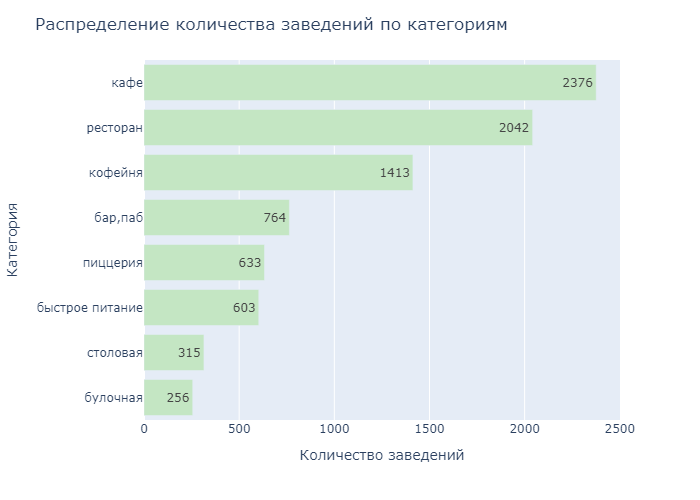

In [44]:
# сгруппируем данные по категориям
places_filtered = places.groupby('category')['index'].count().reset_index()

# переименуем столбцы
places_filtered.columns = ['category','total_count']

fig = px.bar(places_filtered.sort_values(by='total_count', ascending=True), x='total_count',
             y='category', 
             text='total_count',
             color_discrete_sequence = px.colors.sequential.Blugrn)

# оформляем график
fig.update_layout(title='Распределение количества заведений по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория')

fig.show('png')

Таким образом, наибольшее количество заведений (>2300) относятся к категории `кафе`. Наименее популярная категория заведений в представленных данных `булочная` - всего 256 заведений.

### Количество посадочных мест по категориям заведений

Прежде, чем строить визуализации и делать выводы о распределении посадочных мест по категориям, нужно обработать выбросы. Посмотрим на распределение посадочных мест с помощью диаграммы размаха:

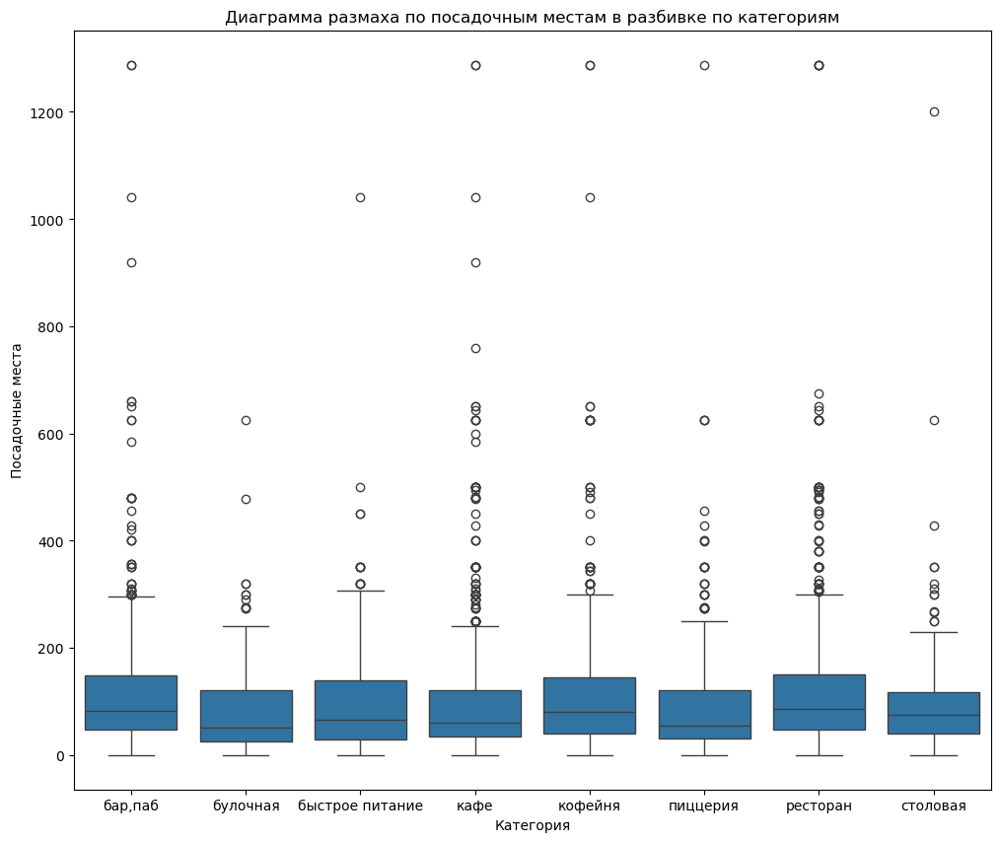

In [48]:
plt.figure(figsize=(12,10))
sns.boxplot(data = places, y = 'seats', x='category')
plt.title('Диаграмма размаха по посадочным местам в разбивке по категориям')
plt.xlabel('Категория')
plt.ylabel('Посадочные места');

По диаграмме видно, что есть нетипично высокие значения посадочных мест во всех категориях заведений. Такие значения кажутся аномальными, особенно для булочных, кофеен и столовых.

Можно исключить из исследования данного подпункта заведения с >400 посадочными местами, однако сначала посмотрим сколько процентов от общего количества заведений мы потеряем по каждой категории:


In [50]:
# количество заведений разных категорий с известным числом посадочных мест

dt_seat = (places.groupby('category')['seats']
           .count()
           .reset_index()
           .sort_values(by='seats', ascending=False)
          )
dt_seat

,category,seats
6,ресторан,1269
3,кафе,1217
4,кофейня,751
0,"бар,паб",467
5,пиццерия,427
2,быстрое питание,349
7,столовая,164
1,булочная,148


In [51]:
# количество заведений разных категорий с числом посадочных мест > 400

seat_abnormal = (places.query('seats>400')
                 .groupby('category')['seats']
                 .count()
                 .reset_index()
                 .sort_values(by='seats', ascending=False)
                )
seat_abnormal

,category,seats
6,ресторан,39
3,кафе,30
4,кофейня,19
0,"бар,паб",18
5,пиццерия,6
2,быстрое питание,4
7,столовая,3
1,булочная,2


In [52]:
# сводим данные в таблицу и считаем процент отброшенных заведений в каждой категории

dt_seat = dt_seat.merge(seat_abnormal, on='category')
dt_seat.columns = ['category','all_seat', 'abnormal_seat']
dt_seat['percent'] = round(dt_seat['abnormal_seat']/dt_seat['all_seat']*100, 2)
dt_seat

,category,all_seat,abnormal_seat,percent
0,ресторан,1269,39,3.07
1,кафе,1217,30,2.47
2,кофейня,751,19,2.53
3,"бар,паб",467,18,3.85
4,пиццерия,427,6,1.41
5,быстрое питание,349,4,1.15
6,столовая,164,3,1.83
7,булочная,148,2,1.35


При отбросе заведений с посадочными местами >400 мест мы теряем в каждой категории не более 4% данных. Примем это за допустимое значение и построим график медианного количества посадочных мест по категориям заведений по отфильтрованным данным:

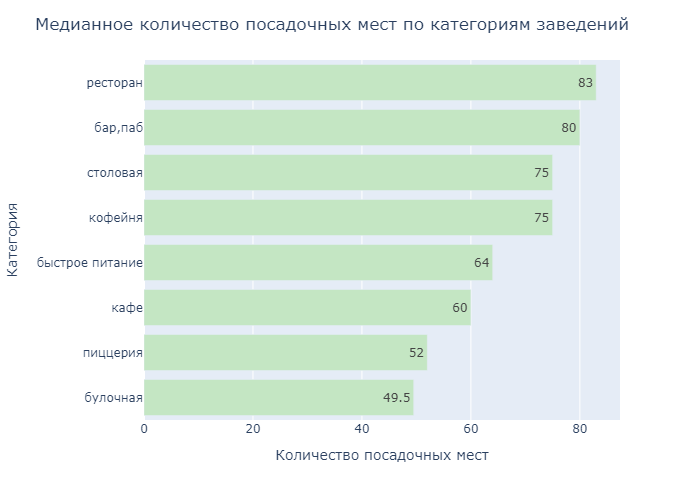

In [54]:
dt_seat = (places.query('seats<=400')
           .groupby('category')['seats']
           .median()
           .reset_index()
           .sort_values(by='seats')
          )

fig = px.bar(dt_seat, x='seats',
             y='category', 
             text='seats',
             color_discrete_sequence = px.colors.sequential.Blugrn)

# оформляем график
fig.update_layout(title='Медианное количество посадочных мест по категориям заведений',
                   xaxis_title='Количество посадочных мест',
                   yaxis_title='Категория')

fig.show('png')

Проверим распределение медианы посадочных мест исходных данных (без исключения аномальных значений):

In [56]:
(places.groupby('category')['seats']
        .median()
        .reset_index()
        .sort_values(by='seats', ascending=False)
)

,category,seats
6,ресторан,86.0
0,"бар,паб",82.0
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


После исключения аномальных значений медианы категорий совсем незначительно изменились.

Таким образом, наибольшее число посадочных мест зачастую предлагают заведения категории **ресторан**, а наименьшее количество посадочных мест наблюдается в **булочных**, что кажется логичным.

### Соотношение сетевых и несетевых заведений

Для того, чтобы рассмотреть соотношение сетевых и несетевых заведений выведем значения суммарного количества каждого вида заведения, а затем построим круговую диаграмму с соотношением:

In [61]:
places.groupby('chain')['index'].count().sort_values(ascending=False)

chain
False    5199
True     3203
Name: index, dtype: int64

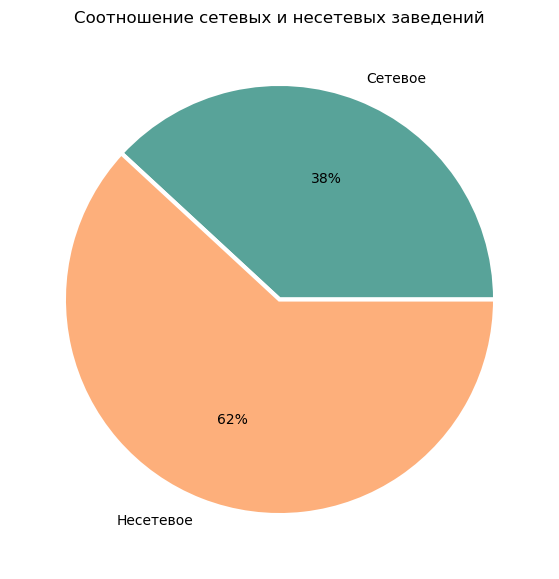

In [62]:
places['chain'] = places['chain'].map({False: 'Несетевое', True: 'Сетевое'})

places.groupby('chain')['index'].count().sort_values().plot(
    kind='pie', 
    autopct='%1.0f%%', 
    title='Соотношение сетевых и несетевых заведений',     
    colors = ['#58A399', '#FDAF7B'],
    wedgeprops = { 'linewidth' : 3, 'edgecolor' : 'white' },
    figsize=(19,7))

plt.ylabel('');

Таким образом, в данных большая часть заведений является несетевыми - **62%**.

### Популярные категории сетевых заведений

Рассмотрим какие категории заведений чаще являются сетевыми:

In [66]:
# создаем сводную таблицу по категориям и принадлежности заведений к сети:

places_chain = places.groupby(['category', 'chain']).agg(count=('index', 'count')).reset_index()

# добавляем сумму кол-ва заведений по районам для дальнейшего расчета доли каждой категории в районе
places_chain['sum'] = places_chain.groupby('category')['count'].transform(sum)

# добавляем данные с долями и сортируем
places_chain['percent'] = round(places_chain['count'] / places_chain['sum']*100, 0)
places_chain = places_chain.sort_values(by='percent')

places_chain

,category,chain,count,sum,percent
1,"бар,паб",Сетевое,168,764,22.0
15,столовая,Сетевое,88,315,28.0
7,кафе,Сетевое,779,2376,33.0
13,ресторан,Сетевое,729,2042,36.0
5,быстрое питание,Сетевое,232,603,38.0
2,булочная,Несетевое,99,256,39.0
10,пиццерия,Несетевое,303,633,48.0
8,кофейня,Несетевое,693,1413,49.0
9,кофейня,Сетевое,720,1413,51.0
11,пиццерия,Сетевое,330,633,52.0


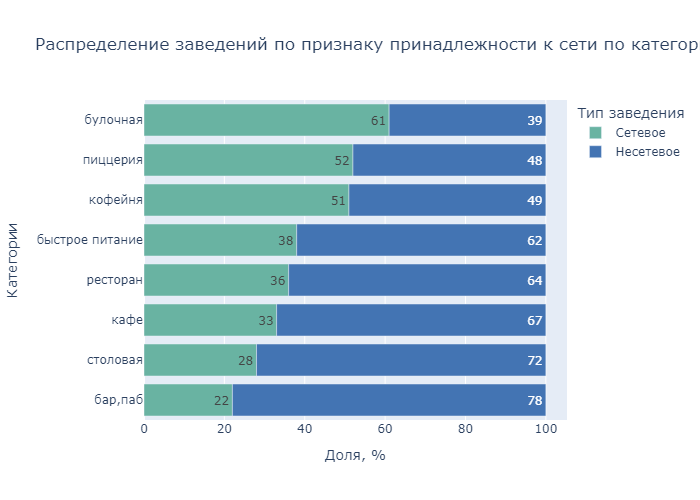

In [67]:
# строим график с разделением на категории

fig = px.bar(places_chain,
             x='percent',
             y='category',
             color='chain',
             color_discrete_sequence = ["#69b3a2", "#4374B3"],
             title='Распределение заведений по признаку принадлежности к сети по категориям',
             text='percent')

fig.update_layout(
    yaxis_title="Категории",
    xaxis_title="Доля, %",
    legend_title='Тип заведения',
)

fig.show('png')

Таким образом, только в 3-х категориях большинство заведений является сетевыми - в булочных, кофейнях и пиццериях.

### Исследование топ-15 популярных сетей в Москве

Сгруппируем данные по названиям заведений и найдём топ-15 популярных сетей в Москве:

In [71]:
# создаем новый датасет с группировкой данных по названию сети
places_top15 =  places.query('chain == "Сетевое"').groupby('name').agg(count=('index', 'count')).reset_index()

# отбираем топ-15 по кол-ву заведений
places_top15 = places_top15.sort_values(by='count', ascending=False).head(15)

places_top15

,name,count
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
759,Яндекс Лавка,69
59,Cofix,65
170,Prime,50
679,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39


In [72]:
# фильтруем исходную таблицу по топ-15 именам сети:
places_top15 = places[places['name'].isin(places_top15['name'])]

# группируем по именам и категориям
places_top15 =  places_top15.groupby(['name', 'category']).agg(count=('index', 'count')).reset_index()

# добавляем сумму кол-ва заведений по именам для сортировки
places_top15['sum'] = places_top15.groupby('name')['count'].transform(sum)

#сортируем данные по кол-ву заведений сети, затем по количеству с учетом категории
places_top15 = places_top15.sort_values(by=['sum', 'count'])

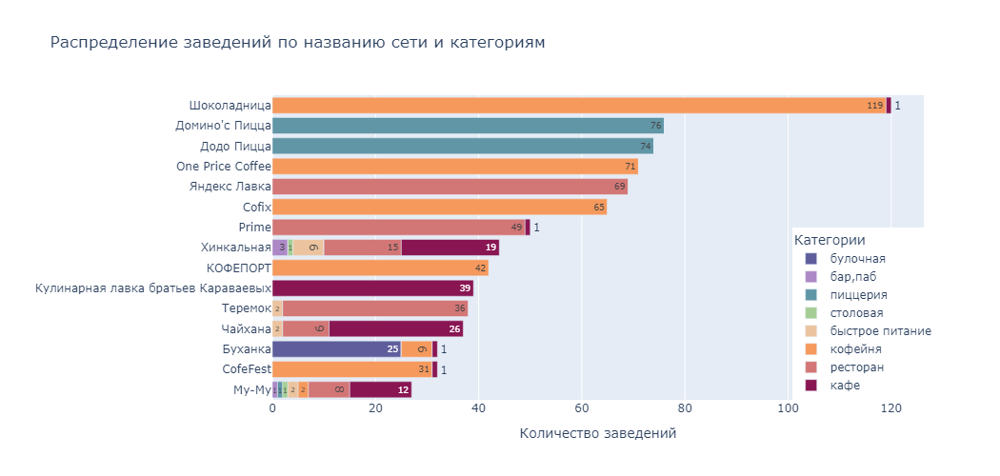

In [73]:
# строим график с разделением на категории

fig = px.bar(places_top15,
             x='count',
             y='name',
             color='category',
             color_discrete_sequence = ["#5F5D9C", "#AD88C6", "#6196A6","#A4CE95","#EBC49F","#F6995C","#D37676","#891652"],
             title='Распределение заведений по названию сети и категориям',
             text='count')

fig.update_layout(
    yaxis_title="",
    xaxis_title="Количество заведений",
    legend=dict(
    xanchor="right",
    y=0),
    legend_title='Категории',
    width=1050
)

fig.show('png')

В графике есть заведения с названиями "хинкальная" и "чайхана", кажется, что они попали в топ из-за отсутствия целостного названия и образовались в результате недозаполнения наименования.

В остальном, многие сети действительно популярны и знакомы - например, кофейня Шоколадница, Домино'c и Додо Пицца.


Многие популярные заведения относятся к категориям: кафе, кофейня, пиццерия и ресторан. Очень редко встречается категория быстрого питания, бар/паб и столовая. В топе нет сетевых заведений с категорией булочная.

### Количество заведений каждой категории по районам

Рассмотрим какие административные районы Москвы присутствуют в датасете и отобразим общее количество заведений и количество заведений каждой категории по районам графиком:

In [78]:
# создаем новый датасет с группировкой данных по району и категориям
districts_grouped =  places.groupby(['district', 'category']).agg(count=('index', 'count')).reset_index()

# добавляем сумму кол-ва заведений по районам для дальнейшего расчета доли каждой категории в районе
districts_grouped['sum'] = districts_grouped.groupby('district')['count'].transform(sum)

#сортируем данные по кол-ву заведений в районе, затем по общему количеству
districts_grouped = districts_grouped.sort_values(by=['sum', 'count'])

# добавляем данные с долями
districts_grouped['proportion'] = round(districts_grouped['count'] / districts_grouped['sum'], 3)

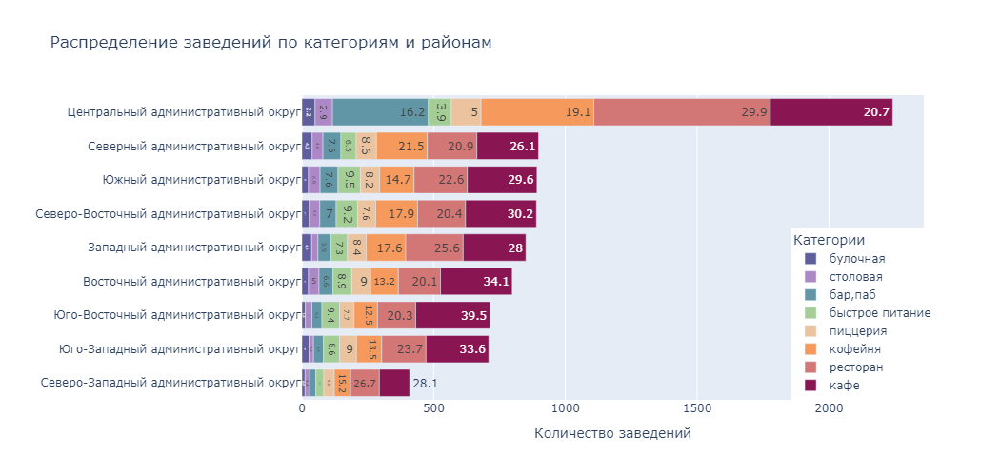

In [79]:
# строим график с разделением на категории

fig = px.bar(districts_grouped,
             x='count',
             y='district',
             color='category',
             color_discrete_sequence = ["#5F5D9C", "#AD88C6", "#6196A6","#A4CE95","#EBC49F","#F6995C","#D37676","#891652"],
             title='Распределение заведений по категориям и районам',
             text=round(districts_grouped['proportion']*100, 2))

fig.update_layout(
    yaxis_title="",
    xaxis_title="Количество заведений",
    legend=dict(
    xanchor="right",
    y=0),
    legend_title='Категории',
    width=1050
)

fig.show('png')

Всего в данных представлено 9 различных районов Москвы, в которых расположены заведения. Наибольшее количество заведений Москвы приходится на **Центральный административный округ**, наименьшее - на **Северо-Западный**.

При этом категории заведений по распределению примерно равны во всех районах, однако выделяется крупная доля ресторанов и баров/пабов в Центральном АО.

### Распределение средних рейтингов по категориям заведений

Визуализируем распределение средних рейтингов по категориям заведений:

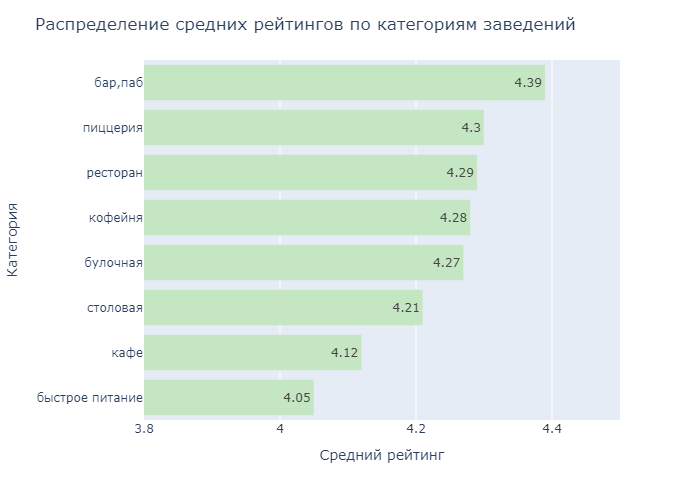

In [83]:
# группируем данные по категориям
dt_rating = (places
           .groupby('category')['rating']
           .mean()
           .reset_index()
           .sort_values(by='rating', ascending=False)
          )

# округляем значение средних рейтингов
dt_rating['rating'] = round(dt_rating['rating'],2)

# строим график
fig = px.bar(dt_rating.sort_values(by='rating'), x='rating',
             y='category', 
             text='rating',
             color_discrete_sequence = px.colors.sequential.Blugrn)

# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Средний рейтинг',
                   yaxis_title='Категория')

fig.update_xaxes(range=[3.8, 4.5])
fig.show('png')

Разница в среднем рейтинге категорий достигает максимально 0,34п. Самый высокий средний рейтинг *4,39* наблюдается у **баров/пабов**, самый низкий средний рейтинг *4,05* - у заведений категории **быстрого питания**.

### Хороплет со средним рейтингом заведений каждого района

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района:

In [87]:
# читаем JSON-файл и сохраняем в переменной
with open('C:/Users/Кристина/Downloads/1.json', encoding="utf-8") as f:
    state_geo = json.load(f)
    
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=places.groupby('district')['rating'].agg('mean'),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.6,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Наибольший средний рейтинг заведений в **Центральном АО**, а наименьший в **Юго-Восточном АО**.

### Карта заведений

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium:

In [94]:
# создаём новую карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m

В центре Москвы сосредоточено большинство заведений города, больше 3 тыс.

### Топ-15 улиц по количеству заведений

Найдём топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам:

In [99]:
# создаем новый датасет с группировкой данных по улицам
street_top15_category =  places.groupby('street').agg(count=('index', 'count')).reset_index()

# отбираем топ-15 по кол-ву заведений
street_top15_category = street_top15_category.sort_values(by='count', ascending=False).head(15)

street_top15_category

,street,count
1090,проспект Мира,183
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [100]:
# фильтруем исходную таблицу по топ-15 улицам:
street_top15_category = places[places['street'].isin(street_top15_category['street'])]

# группируем по улицам и категориям
street_top15_category =  street_top15_category.groupby(['street', 'category']).agg(count=('index', 'count')).reset_index()

# добавляем сумму кол-ва заведений по улицам для дальнейшего расчета доли каждой категории
street_top15_category['sum'] = street_top15_category.groupby('street')['count'].transform(sum)

#сортируем данные по кол-ву заведений на улице, затем по количеству с учетом категории
street_top15_category = street_top15_category.sort_values(by=['sum', 'count'])

# добавляем данные с долями
street_top15_category['proportion'] = round(street_top15_category['count'] / street_top15_category['sum'], 3)

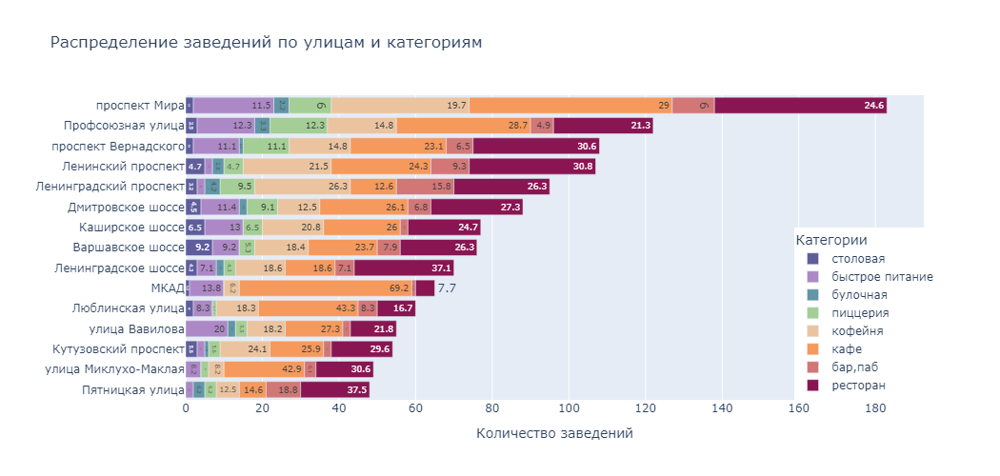

In [101]:
# строим график с разделением на категории

fig = px.bar(street_top15_category,
             x='count',
             y='street',
             color='category',
             color_discrete_sequence = ["#5F5D9C", "#AD88C6", "#6196A6","#A4CE95","#EBC49F","#F6995C","#D37676","#891652"],
             title='Распределение заведений по улицам и категориям',
             text=round(street_top15_category['proportion']*100, 2))

fig.update_layout(
    yaxis_title="",
    xaxis_title="Количество заведений",
    legend=dict(
    xanchor="right",
    y=0),
    legend_title='Категории',
    width=1050
)

fig.show('png')

Больше всего заведений располагается на **проспекте Мира**. При этом чаще встречается категория **кафе**, реже остальных категорий - **столовые**. Какие-то категории совершенно отсутствуют в некоторых районах. Например, булочных нет на Варшавском шоссе, МКАДе, улице Миклухо-Маклая, Каширском шоссе и Люблинской улице. Столовых нет на улице Миклухо-Маклая, Вавилова и Пятницкой. На МКАДе нет пиццерий.

### Улицы с одним объектом общепита

Найдём улицы, на которых находится только один объект общепита:

In [106]:
street_one_pc = places.pivot_table(index='street', values='index', aggfunc='count').reset_index()
street_one_pc.columns = ['street', 'count_pc']
street_one_pc = street_one_pc.query('count_pc == 1')
# фильтруем исходную таблицу по топ-15 улицам:
street_one_pc = places[places['street'].isin(street_one_pc['street'])]

Построим карту с распределением таких заведений:

In [108]:
# создаём новую карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
street_one_pc.apply(create_clusters, axis=1)

# выводим карту
m

Улицы с одним объектом общепита находятся в разных районах Москвы. Думаю, что в случае с центральным районам существует много проспектов и переулков. Посмотрим отдельно именно улицы:

In [110]:
street_one_pc = street_one_pc[street_one_pc['street'].str.contains(r'улица')]

In [111]:
# создаём новую карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
street_one_pc.apply(create_clusters, axis=1)

# выводим карту
m

Таким образом, большинство улиц с единственным объектом общепита на удивление чаще встречается в центральных районах города, чем на окраине.

### Значения средних чеков заведений по районам города

Посчитаем медиану средних чеков для каждого района:

In [116]:
# группируем данные по районы и считаем медианные значения среднего чека для каждого
district_avg_bill = (
    places.groupby('district')
    .agg({'middle_avg_bill': 'median'})
    .reset_index()
    .sort_values(by='middle_avg_bill', ascending=False)
)

Используем медиану в качестве ценового индикатора района и построим фоновую картограмму (хороплет) с полученными значениями для каждого района:

In [119]:
# строим хороплет

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.6,
    legend_name='Медиана среднего чека заведений по районам',
).add_to(m)

# выводим карту
m

Наибольшая медиана среднего чека приходится на **центральный район**, а также на **западный округ** - медиана в них 908-1000 руб. Наименьшее значение среднего чека наблюдается в **южном, юго-восточном и северо-восточном** административных округах - там медиана находится в диапазоне 450-542 руб.

### Популярные категории круглосуточных заведений и их расположения

Исследуем заведения с круглосуточным режимом работы и их зависимость от расположения и категории заведения:

In [123]:
# группируем данные по категориям и графику работы:
places_is_24_7 = places.groupby(['is_24_7', 'category']).agg(count=('index', 'count')).reset_index()

# добавляем сумму кол-ва заведений по районам для дальнейшего расчета доли каждой категории в районе
places_is_24_7['sum'] = places_is_24_7.groupby('category')['count'].transform(sum)

# добавляем данные с долями и сортируем
places_is_24_7['percent'] = round(places_is_24_7['count'] / places_is_24_7['sum']*100, 0)
places_is_24_7 = places_is_24_7.sort_values(by='percent', ascending=False)

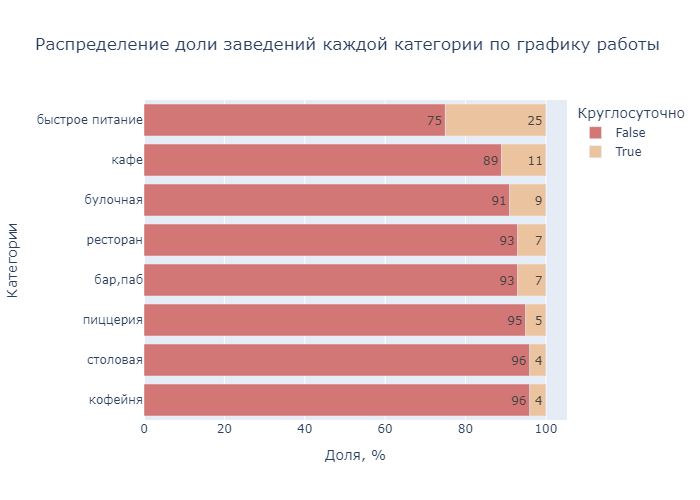

In [124]:
# строим график с разделением на категории

fig = px.bar(places_is_24_7,
             x='percent',
             y='category',
             color='is_24_7',
             color_discrete_sequence = ["#D37676", "#EBC49F"],
             title='Распределение доли заведений каждой категории по графику работы',
             text='percent')

fig.update_layout(
    yaxis_title="Категории",
    xaxis_title="Доля, %",
    legend_title='Круглосуточно',
)

fig.show('png')

Преимущественно заведения не работают по графику "ежедневно, круглосуточно". В разрезе категорий видно, что чаще остальных без перерывов и выходных работают заведения быстрого питания - около 25%.

Посмотрим на расположение круглосуточных заведений:

In [127]:
# создаём новую карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
(places[places['is_24_7'] == True]).apply(create_clusters, axis=1)

# выводим карту
m

Преимущественно круглосуточные заведения расположены в центре города, но так же большое количество таких заведений встречается на северо-западе.

**Вывод по разделу**

- наиболее популярными категориями заведений являются **кафе, рестораны и кофейни**, меньше всего в данных **столовых и булочных**;
- наибольшее число посадочных мест зачастую предлагают заведения категории **ресторан**, однако в данных по посадочным местам замечены аномально высокие значения, особо несвойственные для такой категории, как булочная;
- большая часть заведений относится к несетевым типам - **68%** от общего количества, при этом только в 3-х категориях большинство заведений являются **сетевыми - в булочных, кофейнях и пиццериях**;
- рассмотрен топ-15 сетевых заведений Москвы; выявлено, что многие из них относятся к категориям: **кафе, кофейня, пиццерия и ресторан**;
- наибольшее количество заведений Москвы приходится на **Центральный административный округ, наименьшее - на Северо-Западный**;
- разница в среднем рейтинге категорий достигает максимально *0,34п*. Самый **высокий** средний рейтинг 4,39 наблюдается у **баров/пабов**, самый **низкий** средний рейтинг 4,05 - у заведений категории **быстрого питания**, при этом наибольший средний рейтинг заведений в **Центральном округе, а наименьший в Северо-Восточном и Юго-Восточном округах**;
- больше всего заведений располагается на **проспекте Мира**, при этом больше всего там находится заведений категории **кафе, меньше всего - столовых**;
- большинство улиц с единственным объектом общепита чаще встречается в центральных районах города, чем на окраине;
- наибольшая медиана среднего чека приходится на **центральный район**, а также на **западный округ** - медиана в них **до 1000 тыс. руб**, наименьшее значение среднего чека наблюдается в **южном, юго-восточном и северо-восточном административных округах**;
- преимущественно заведения не работают по графику "ежедневно, круглосуточно", в разрезе категорий чаще остальных без перерывов и выходных работают заведения **быстрого питания** - около 25% всех заведений категории.

Далее на основе анализа всего рынка детализируем исследование и дадим рекомендации по открытию новой кофейни.

## Детализация исследования: открытие кофейни

### Особенности расположения кофеен

Рассмотрим сколько всего кофеен в датасете и в каких районах их больше всего:

In [135]:
places[places['category'] == 'кофейня']['index'].count()

1413

Всего 1413 заведений категории кофейня, рассмотрим их долю в общем количестве заведений:

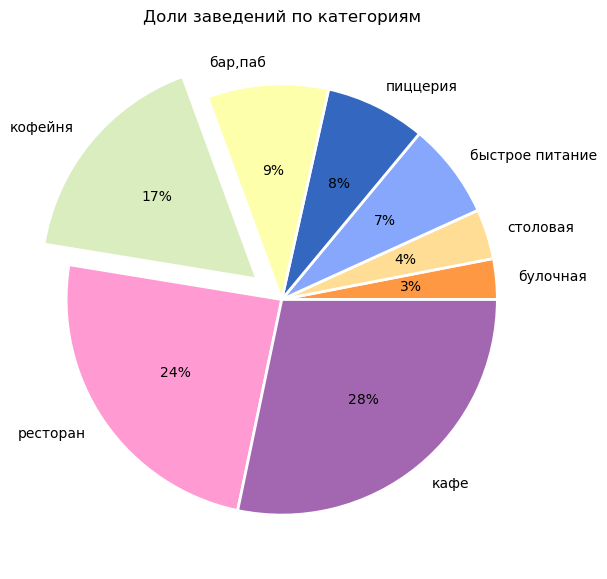

In [137]:
# узнаём индекс, где категория = кофейня, для того, чтобы выделить в графике именно эту долю заведений

index = places[places['category']=='кофейня'].index[0]
explode = [0, 0, 0, 0, 0, 0, 0, 0]
explode[8-index] = 0.15

# строем круговую диаграмму
places.groupby('category')['index'].count().sort_values().plot(
    kind='pie', 
    autopct='%1.0f%%', 
    title='Доли заведений по категориям',     
    colors = ['#FF9843', '#FFDD95', '#86A7FC', '#3468C0', '#FDFFAB', '#D9EDBF', '#FF9BD2', '#A367B1'],
    wedgeprops = { 'linewidth' : 2, 'edgecolor' : 'white' },
    explode=explode,
    figsize=(19,7))

plt.ylabel('');

Таким образом, кофейням принадлежит 17% от всех заведений датасета. Это 3-я категория по популярности.

In [139]:
# создадим новый датафрейм с группировкой кофеен по районам:

coffe_h = (places.query('category == "кофейня"')).groupby('district')['index'].count()
coffe_h.columns = ['district', 'count']
coffe_h.sort_values(ascending = False)

district
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: index, dtype: int64

Построим хороплёт в зависимости от количества кофеен в каждом районе, а также отметим кофейни кластерами:

In [141]:
# строим хороплет

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
(places.query('category == "кофейня"')).apply(create_clusters, axis=1)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffe_h,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.6,
    legend_name='Количество кофеен по районам',
).add_to(m)

# выводим карту
m

Большинство кофеен находится в Центральном административном округе - 428 заведений. Наименьшее количество в Северо-Западном административном округу - 62 кофейни. В целом, покрытие города кофейнями почти равномерное, встречаются кофейни находящиеся в соседних домах, особенно в центральном районе города.

### Круглосуточные кофейни

Ещё в п.3.13 исследования мы видели, что в датасете есть круглосуточные кофейни, но их очень мало. Выведем данные о таких кофейнях:

In [146]:
places_is_24_7.query('category == "кофейня"')

,is_24_7,category,count,sum,percent
4,False,кофейня,1354,1413,96.0
12,True,кофейня,59,1413,4.0


In [147]:
places_is_24_7 = places.query('(category == "кофейня")&(is_24_7 == True)')

59 кофеен имеют круглосуточный график работы, это составляет ~4% от всех кофеен.

In [149]:
# создаём новую карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
places_is_24_7.apply(create_clusters, axis=1)

# выводим карту
m

Чаще всего круглосуточные кофейни расположены в центре города.

In [152]:
places_is_24_7.groupby('name')['index'].count().sort_values(ascending=False)

name
Шоколадница           17
Кофемания              8
Wild Bean Cafe         6
Wild Bean              5
Кофе Хауз              3
You&coffee             2
Cofix                  2
Кофе с собой           2
Столица                1
Пирог Хауз             1
Молоко                 1
Лаванда Кофе           1
Кофейня One&Double     1
Cinnabon               1
Кофе On                1
The wild bean cafe     1
One&Double             1
One more, please       1
One Price Coffee       1
One And Double         1
FoodMoscowCoffee       1
Гоголь-Моголь          1
Name: index, dtype: int64

Причём большинство из круглосуточных кофеен принадлежат к сетям: Шоколадница, Кофемания, Wild Bean Cafe и другие.

### Рейтинги кофеен

Посмотрим средний рейтинг всех кофеен в датасете:

In [156]:
dt_rating.query('category == "кофейня"')

,category,rating
4,кофейня,4.28


Из исследований п.3.7 мы знаем, что кофейни находятся на 4-м месте по среднему рейтингу всех категорий заведений.

Далее посмотрим на распределение рейтинга кофеен по районам Москвы:

In [158]:
# строим хороплет

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=(
        places.query('category=="кофейня"')
        .groupby('district')['rating']
        .agg('mean')
    ),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.6,
    legend_name='Средний рейтинг кофеен',
).add_to(m)

# выводим карту
m

Самые низкие рейтинги в **Западном АО** и **Северо-Восточном АО**, самые высокие в **Центральном и Северо-Западном АО**.
Для открытия кофейни лучше выбрать район со средним рейтингом пониже, так будет легче конкурировать на рынке.

### Стоимость чашки капучино в кофейнях

В данном пункте исследуем на какую стоимость чашки капучино стоит ориентироваться при открытии и почему.

Но сначала проверим столбец `middle_coffee_cup` на выбросы с помощью диаграммы размаха:

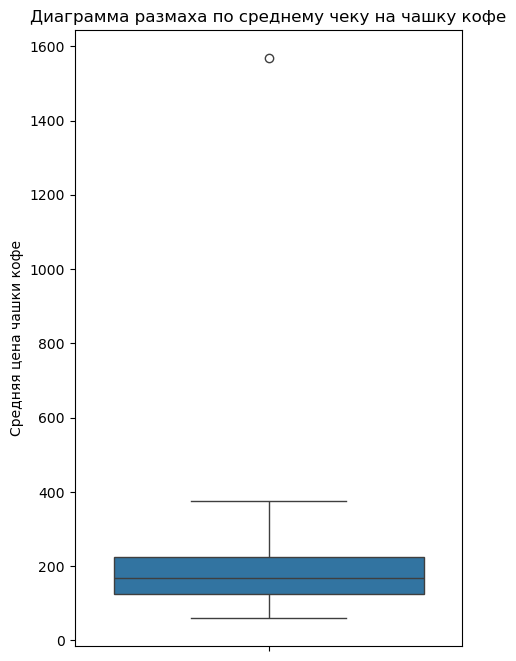

In [168]:
plt.figure(figsize=(5,8))
sns.boxplot(data = places, y='middle_coffee_cup')
plt.title('Диаграмма размаха по среднему чеку на чашку кофе')
plt.ylabel('Средняя цена чашки кофе');

Судя по диаграмме размаха в данных есть выброс со стоимостью за чашку кофе более 1500 рублей. Исключим эту строку из дальнейшего анализа.

In [170]:
places_middle_coffee_cup = places.query('(category == "кофейня")&(middle_coffee_cup < 1400)')

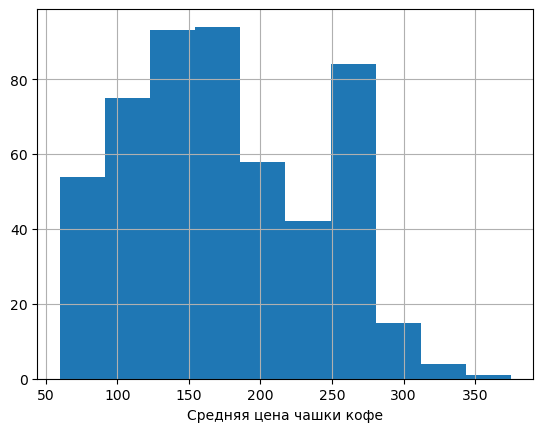

In [171]:
# проверка на выбросы с помощью гистограммы

places_middle_coffee_cup['middle_coffee_cup'].hist()
plt.xlabel('Средняя цена чашки кофе');

Выбросов нет.

Далее посмотрим на распределение средней цены чашки кофе по районам Москвы, но для корректного расчета средней цены нужно исключить строки с пропусками в столбце `middle_coffee_cup`. Заменим пропуски в нём на *-1*, а затем отфильтруем их.

In [173]:
places_middle_coffee_cup['middle_coffee_cup'] = places_middle_coffee_cup['middle_coffee_cup'].fillna(-1)
places_middle_coffee_cup = places_middle_coffee_cup.query('(category=="кофейня")&(middle_coffee_cup!=-1)')

In [174]:
# строим хороплет

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=places_middle_coffee_cup.groupby('district')['middle_coffee_cup'].agg('median'),
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.6,
    legend_name='Медиана средней цены за чашку кофе ',
).add_to(m)

# выводим карту
m

Таким образом самый высокий чек на чашку кофе в Центральном, Западном и Юго-Западном АО (188-198 руб). Самый низкий - в Восточном АО (135-146 руб).

Посмотрим распределение цены чашки кофе по рейтингам кофеен:

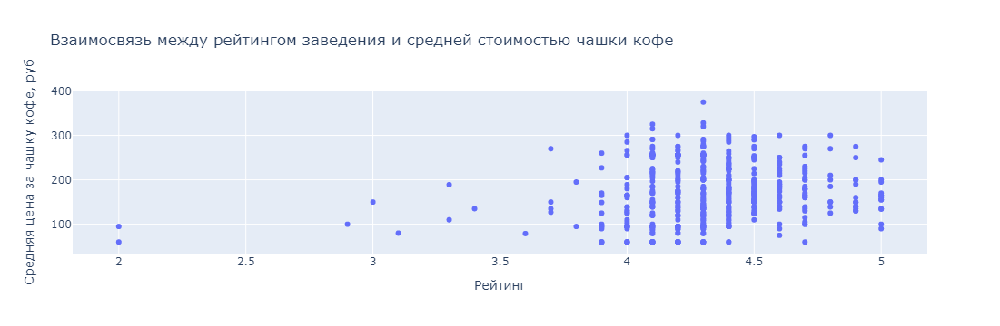

In [178]:
# строим график с разделением на категории

fig = px.scatter(places_middle_coffee_cup,
             x='rating',
             y='middle_coffee_cup',
             title='Взаимосвязь между рейтингом заведения и средней стоимостью чашки кофе')

fig.update_layout(
    yaxis_title="Средняя цена за чашку кофе, руб",
    xaxis_title="Рейтинг"
)

fig.show()

Линейной зависимости между ценой и рейтингом не наблюдается. Однако видно, что у заведений с самой высокой ценой за кофе не самый высокий рейтинг, а у заведений с рейтингом ~5.0 цена за чашку кофе не слишком высокая, чаще в среднем 150-200 рублей.

На начальном этапе открытия кофейни не следует ставить слишком высокую цену, нужно завлечь клиентов и наработать базу, при этом заходить на территорию, где очень низкая средняя цена за чашку кофе тоже сложно, увеличивается конкуренция и нужно держать конкурентноспособную цену.

Судя по всему анализу из п.4, мы бы рекомендовали открывать кофейню в Западном АО, тк рынок там не перенасыщен, средний рейтинг кофеен низкий, а медианная цена на чашку кофе выше 188 руб. Таким образом, при открытии кофейни там на начальном этапе цена за чашку кофе в ~175-180 рублей была бы достаточно конкурентоспособной.

Но важно учитывать стоимость аренды/покупки недвижимости во всех АО Москвы, проходимость отдельных территорий, их застройку для более корректной рекомендации.

### Расположение популярных сетевых кофейн

Дополнительно построим карту с расположение топ-5 популярных сетевых кофеен Москвы вместе с хороплетом по их рейтингу:

In [183]:
# группируем кофейни по имени и выбираем топ-5 по кол-ву:

coffe_top5 = places.query('category=="кофейня"').groupby('name').agg(count=('index', 'count')).reset_index()
coffe_top5 = coffe_top5.sort_values(by='count', ascending=False).head(5)
coffe_top5 = places[places['name'].isin(coffe_top5['name'])]

In [184]:
# создаём новую карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
coffe_top5.apply(create_clusters, axis=1)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffe_top5.groupby('district')['rating'].agg('mean'),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.6,
    legend_name='Средний рейтинг кофеен',
).add_to(m)

# выводим карту
m

Сетевые кофейни имеют не слишком высокий рейтинг, в среднем не выше 4.18. Большинство топовых сетевых кофеен с максимальным рейтингом находятся в Центральном и Восточном АО.

**Вывод по разделу**

 - кофейням принадлежит 17% от всех заведений датасета - это 3-я категория по популярности;
 - 59 кофеен имеют круглосуточный график работы, это составляет ~4% от всех кофеен, а значит круглосуточный график работы в данной категории непопулярен;
 - самые низкие рейтинги кофеен в **Западном АО** и **Северо-Восточном АО**, самые высокие в **Центральном и Северо-Западном АО**;
 - самый высокий чек на чашку кофе в **Центральном, Западном и Юго-Западном АО (188-198 руб)**. Самый низкий - в **Восточном АО (135-146 руб)**. Линейной зависимости между ценой и рейтингом не наблюдается.

На основе проведенного исследования выработаны следующие рекомендации: мы бы рекомендовали открывать кофейню в Западном АО, так как рынок кофеен там не перенасыщен (АО на 4-м месте по количеству кофеен), средний рейтинг ниже, чем в остальных АО (легче конкурировать), а медианная цена на чашку кофе одна из самых высоких. При этом Западный округ считается одним из престижных для проживания, там расположены многочисленные институты и университет, а также многие иностранные посольства.

При рассмотрении отдельных районов Западного АО можно предложить открыть заведение в районе Раменки, там расположен МГУ и ниже по Мичуринскому проспекту наблюдается небольшая конкуренция кофеен.

При открытии кофейни на начальном этапе цена за чашку кофе в ~175-180 рублей позволила бы конкурировать с другими заведениями в данном АО и получать большую выручку, чем во многих других АО Москвы.

Но важно учитывать другие факторы, например, стоимость аренды/покупки недвижимости во всех АО Москвы, проходимость отдельных территорий, их застройку и тд для более детального анализа и корректной рекомендации по открытию заведения. 

## Презентация

Презентация: <https://drive.google.com/file/d/15QsEIdsZUUUyGXDPqU2YhyaWYn-_rGnb/view?usp=drive_link> 

## Общий вывод

В ходе проведенного исследования рынка заведений общественного питания Москвы были проработаны следующие этапы:

- выполнена предобработка данных: установлен корректный тип данных, проведена проверка на пропуски и дубликаты;
- добавлены столбцы с названием улиц, а также отдельный столбец с обозначением работает ли заведение ежедневно и круглосуточно (24/7);
- выполнен анализ данных;
- проведена детализация исследования в отношении открытия кофейни;
- подготовлена презентация для инвесторов.

**После проведенного исследования можно сделать следующие выводы:**

1. Проведя исследование данных в целом по заведениям Москвы можно сделать следующие выводы:

- наиболее популярными категориями заведений являются **кафе, рестораны и кофейни**, меньше всего в данных **столовых и булочных**;
- наибольшее число посадочных мест зачастую предлагают заведения категории **ресторан**, однако в данных по посадочным местам замечены аномально высокие значения, особо несвойственные для такой категории, как булочная;
- большая часть заведений относится к несетевым типам - **68%** от общего количества, при этом только в 3-х категориях большинство заведений является **сетевыми - в булочных, кофейнях и пиццериях**;
- рассмотрен топ-15 сетевых заведений Москвы; выявлено, что многие из них относятся к категориям: **кафе, кофейня, пиццерия и ресторан**;
- наибольшее количество заведений Москвы приходится на **Центральный административный округ, наименьшее - на Северо-Западный**;
- разница в среднем рейтинге категорий достигает максимально *0,34п*. Самый **высокий** средний рейтинг 4,39 наблюдается у **баров/пабов**, самый **низкий** средний рейтинг 4,05 - у заведений категории **быстрого питания**, при этом наибольший средний рейтинг заведений в **Центральном округе**, а наименьший в **Северо-Восточном и Юго-Восточном округах**;
- больше всего заведений располагается на **проспекте Мира**, при этом больше всего там находится заведений категории **кафе, меньше всего - столовых**;
- большинство улиц с единственным объектом общепита на удивление чаще встречается в центральных районах города, чем на окраине;
- наибольшая медиана среднего чека приходится на **центральный район**, а также на **западный округ** - медиана в них **до 1000 тыс. руб**, наименьшее значение среднего чека наблюдается в **южном, юго-восточном и северо-восточном административных округах**;
- преимущественно заведения не работают по графику "ежедневно, круглосуточно", в разрезе категорий чаще остальных без перерывов и выходных работают заведения **быстрого питания**
-  - около 25% всех заведений категории.

2. На этапе исследования данных с целью получения рекомендаций по открытию кофейни получены следующие результаты:

- кофейням принадлежит **17% от всех заведений датасета** - это 3-я категория по популярности;
- **59 кофеен имеют круглосуточный график работы, это составляет ~4% от всех кофеен**, а значит круглосуточный график работы в данной категории непопулярен;
- самые низкие рейтинги в **Западном АО** и **Северо-Восточном АО**, самые высокие в **Центральном и Северо-Западном АО**;
- самый высокий чек на чашку кофе в **Центральном, Западном и Юго-Западном АО (188-198 руб)**. Самый низкий - **в Восточном АО (135-146 руб)**. Линейной зависимости между ценой и рейтингом не наблюдается.

**На основе проведенного исследования выработаны следующие рекомендации:**

На основе проведенного исследования выработаны следующие рекомендации: мы бы рекомендовали открывать кофейню в **Западном АО**, так как рынок кофеен там не перенасыщен (АО на 4-м месте по количеству кофеен), средний рейтинг ниже, чем в остальных АО (легче конкурировать), а медианная цена на чашку кофе одна из самых высоких. При этом Западный округ считается одним из престижных для проживания, там расположены многочисленные институты и университет, а также многие иностранные посольства.

При рассмотрении отдельных районов Западного АО можно предложить открыть заведение в районе Раменки, там расположен МГУ и ниже по Мичуринскому проспекту наблюдается небольшая конкуренция кофеен.

При открытии кофейни на начальном этапе цена за чашку кофе в **~175-180 рублей** позволила бы конкурировать с другими заведениями в данном АО и получать большую выручку, чем во многих других АО Москвы.

Но важно учитывать другие факторы, например, стоимость аренды/покупки недвижимости во всех АО Москвы, проходимость отдельных территорий, их застройку и тд для более детального анализа и корректной рекомендации по открытию заведения. 
